In [70]:
import time
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# import seaborn as sns
from sklearn import metrics
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import LabelEncoder
import datetime
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD  
from tqdm import tqdm
from catboost import CatBoostClassifier, Pool
import pickle

In [3]:
import openpyxl
import os

# read data

In [6]:
# the folder list of control group, you can subtitute it with your folders
control_folders = ["2021-09-13_control/Original_Excel/", "2021-09-14_control/Original_Excel/", "2021-09-15_control/Original_Excel/", "2021-09-16_control/Original_Excel/", "2021-09-17_control/Original_Excel/"]

In [9]:
# read all files in control folders and merge into a dataframe
control_df = pd.DataFrame()
for folder in control_folders:
    filelist = os.listdir(folder)
    for file in filelist:
        df = pd.read_excel(folder + file)
        control_df = pd.concat([control_df, df], axis=0, ignore_index=True)

In [14]:
control_df

,ID,Label,Accepted,Score,Begin Time (s),End Time (s),Call Length (s),Principal Frequency (kHz),Low Freq (kHz),High Freq (kHz),Delta Freq (kHz),Frequency Standard Deviation (kHz),Slope (kHz/s),Sinuosity,Mean Power (dB/Hz),Tonality,Peak Freq (kHz)
0,1,USV,True,0.558040,59.579463,59.598681,0.019219,37.178146,33.431805,40.924488,7.492683,3.379792,190.730477,2.598774,-71.607768,0.215996,39.987903
1,2,USV,True,0.510336,68.481063,68.501884,0.020820,47.957516,47.489223,56.542882,9.053659,4.256629,-122.871570,3.083370,-70.003912,0.206146,48.113613
2,3,USV,True,0.625913,86.800839,86.839276,0.038438,32.484296,21.557466,36.855027,15.297561,4.503624,380.863331,1.681628,-59.345028,0.332160,27.489174
3,4,USV,True,0.562788,190.157621,190.228090,0.070469,79.396492,63.345517,84.973975,21.628458,5.007774,174.350140,2.537928,-53.456979,0.351632,81.227634
4,5,USV,True,0.519375,203.819562,203.854796,0.035234,79.981391,78.420415,88.410659,9.990244,3.380196,-112.937299,5.692686,-52.013645,0.322450,78.732610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8098,93,USV,True,0.550537,3212.426543,3212.455371,0.028828,35.617426,33.744255,35.929621,2.185366,0.782715,63.210034,1.141714,-71.440471,0.193816,35.929621
8099,94,USV,True,0.641405,3416.443037,3416.481475,0.038437,36.241306,35.616916,39.363257,3.746341,1.160769,8.110947,2.212583,-70.926262,0.202479,36.241306
8100,95,USV,True,0.579325,3429.195996,3429.208809,0.012812,54.672759,50.302028,54.984954,4.682927,2.006324,265.901827,3.022554,-74.128978,0.199499,50.302028
8101,96,USV,True,0.501272,3443.605605,3443.693691,0.088086,35.926825,30.307312,39.048776,8.741463,1.572127,-9.060227,2.772187,-70.540246,0.192203,35.926825


In [11]:
# the folder list of dopa group, you can subtitute it with your folders
dopa_folders = ["2021-09-28_drug/Original_Excel/", "2021-09-29_drug/Original_Excel/", "2021-09-30_drug/Original_Excel/", "2021-10-04_drug/Original_Excel/", "2021-10-07_drug/Original_Excel/", "2021-10-08_drug/Original_Excel/"]

In [15]:
# read all files in dopa folders and merge into a dataframe
dopa_df = pd.DataFrame()
for folder in dopa_folders:
    filelist = os.listdir(folder)
    for file in filelist:
        df = pd.read_excel(folder + file)
        dopa_df = pd.concat([dopa_df, df], axis=0, ignore_index=True)

In [16]:
dopa_df

,ID,Label,Accepted,Score,Begin Time (s),End Time (s),Call Length (s),Principal Frequency (kHz),Low Freq (kHz),High Freq (kHz),Delta Freq (kHz),Frequency Standard Deviation (kHz),Slope (kHz/s),Sinuosity,Mean Power (dB/Hz),Tonality,Peak Freq (kHz)
0,1,USV,True,0.765347,10.944999,10.972225,0.027227,75.296940,72.174989,77.482306,5.307317,1.300047,-77.575165,2.062180,-67.921952,0.303104,75.609135
1,2,USV,True,0.506083,12.004156,12.023375,0.019219,74.357055,73.732665,74.669250,0.936585,0.276731,16.264835,1.180260,-68.061514,0.283499,74.357055
2,3,USV,True,0.575525,22.293231,22.312450,0.019219,75.297199,71.863053,78.731345,6.868293,2.416333,-389.195603,1.055566,-71.331468,0.233434,74.360614
3,4,USV,True,0.652720,22.418153,22.448583,0.030430,74.672047,73.735461,77.793998,4.058537,1.086087,-79.195065,1.767257,-68.251624,0.279952,74.672047
4,5,USV,True,0.694272,26.242299,26.253510,0.011211,81.226872,79.978091,81.539067,1.560976,0.512650,-81.221495,1.931876,-65.418614,0.260611,81.226872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9716,186,USV,True,0.752465,4168.462676,4168.571582,0.108906,50.080971,45.534991,56.837358,11.302367,3.746003,-108.795504,1.199699,-55.988367,0.454472,54.357261
9717,187,USV,True,0.560708,4168.731348,4168.792207,0.060859,52.990148,45.541391,53.986179,8.444788,2.024389,-49.212191,1.395561,-52.056980,0.342043,52.083848
9718,188,USV,True,0.672220,4168.925918,4169.062051,0.136133,43.907566,39.398461,51.414038,12.015577,3.804892,-71.754529,1.295589,-57.500757,0.389141,51.414038
9719,189,USV,True,0.678009,4169.190508,4169.214531,0.024023,54.047858,47.803956,57.794200,9.990244,3.189167,-409.294648,1.722100,-54.204256,0.296759,57.482005


# -------------------

The same data load operation to load screened data in both groups. 

These blocks needs run parallelly with blocks using orignal data.

In [74]:
# processed_control_folders = ["2021-09-13_control/Processed_Excel/", "2021-09-14_control/Processed_Excel/", "2021-09-15_control/Processed_Excel/", "2021-09-16_control/Processed_Excel/", "2021-09-17_control/Processed_Excel/"]

In [76]:
# processed_control_df = pd.DataFrame()
# for folder in processed_control_folders:
#     filelist = os.listdir(folder)
#     for file in filelist:
#         df = pd.read_excel(folder + file)
#         processed_control_df = pd.concat([processed_control_df, df], axis=0, ignore_index=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_3864\3593822171.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_control_df = pd.concat([processed_control_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_3864\3593822171.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_control_df = pd.concat([processed_control_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_3864\3593822171.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_control_df = pd.concat([processed_control_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Lo

In [77]:
# processed_control_df

,ID,Label,Accepted,Score,Begin Time (s),End Time (s),Call Length (s),Principal Frequency (kHz),Low Freq (kHz),High Freq (kHz),Delta Freq (kHz),Frequency Standard Deviation (kHz),Slope (kHz/s),Sinuosity,Mean Power (dB/Hz),Tonality,Peak Freq (kHz)
0,1,USV,True,0.556852,5388.717559,5388.733574,0.016016,50.612188,46.553651,53.421944,6.868293,2.532439,136.978954,2.115342,-71.050371,0.225544,50.924383
1,1,USV,True,0.504116,683.208159,683.219370,0.011211,47.801418,44.367272,52.796540,8.429268,3.631408,138.662676,5.945534,-74.515978,0.162098,47.801418
2,2,USV,True,0.511672,1175.519058,1175.615151,0.096094,81.535767,65.613816,94.647962,29.034146,9.591530,45.601831,11.701842,-75.086279,0.164165,92.774792
3,3,USV,True,0.524383,1404.126157,1404.154985,0.028828,27.645780,23.118951,33.733585,10.614634,3.539206,221.832632,7.472132,-59.690494,0.206161,24.992121
4,4,USV,True,0.503930,1411.497739,1411.515356,0.017617,38.116256,36.243085,39.365036,3.121951,1.160154,-92.399503,2.106840,-63.916431,0.250811,39.052841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
734,9,USV,True,0.525750,2481.921768,2481.953799,0.032031,35.929366,33.431805,36.865951,3.434146,1.038790,-18.506163,1.867051,-69.797862,0.259978,36.553756
735,10,USV,True,0.612797,2489.730361,2489.744775,0.014414,40.928043,37.806092,46.547555,8.741463,3.442246,-122.368949,10.872156,-71.350148,0.168234,44.674384
736,11,USV,True,0.521939,2684.483447,2684.505869,0.022422,35.928604,35.616409,37.177384,1.560976,0.751865,3.125725,1.400599,-70.244250,0.199653,35.928604
737,12,USV,True,0.566361,2687.258252,2687.266260,0.008008,47.485920,45.300554,47.485920,2.185366,1.049459,-296.930675,1.118446,-54.423310,0.307277,47.485920


In [80]:
# processed_dopa_folders = ["2021-09-28_drug/Processed_Excel/", "2021-09-29_drug/Processed_Excel/", "2021-09-30_drug/Processed_Excel/", "2021-10-04_drug/Processed_Excel/", "2021-10-07_drug/Processed_Excel/", "2021-10-08_drug/Processed_Excel/"]

In [81]:
# processed_dopa_df = pd.DataFrame()
# for folder in processed_dopa_folders:
#     filelist = os.listdir(folder)
#     for file in filelist:
#         df = pd.read_excel(folder + file)
#         processed_dopa_df = pd.concat([processed_dopa_df, df], axis=0, ignore_index=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_3864\961765640.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_dopa_df = pd.concat([processed_dopa_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_3864\961765640.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_dopa_df = pd.concat([processed_dopa_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_3864\961765640.py:6: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  processed_dopa_df = pd.concat([processed_dopa_df, df], axis=0, ignore_index=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_38

In [82]:
# processed_dopa_df.head()

,ID,Label,Accepted,Score,Begin Time (s),End Time (s),Call Length (s),Principal Frequency (kHz),Low Freq (kHz),High Freq (kHz),Delta Freq (kHz),Frequency Standard Deviation (kHz),Slope (kHz/s),Sinuosity,Mean Power (dB/Hz),Tonality,Peak Freq (kHz)
0,1,USV,True,0.506715,3565.116836,3565.124844,0.008008,78.422450,76.237084,84.354157,8.117073,3.459595,897.591965,1.857972,-76.020369,0.188591,78.422450
1,2,USV,True,0.684770,3569.349014,3569.379443,0.030430,56.081954,54.677076,58.423418,3.746341,1.313936,71.963466,2.193898,-59.033281,0.443133,55.613662
2,3,USV,True,0.694968,3569.461270,3569.538145,0.076875,39.763888,30.619763,40.922202,10.302439,2.862397,-93.739519,1.268312,-53.981199,0.398301,40.297811
3,4,USV,True,0.565180,3569.635391,3569.664219,0.028828,55.612393,51.866051,59.670929,7.804878,2.420475,47.989217,4.221559,-52.865720,0.337120,57.173368
4,5,USV,True,0.558038,4705.205488,4705.216699,0.011211,73.420721,68.425599,76.854867,8.429268,2.904701,-491.093744,1.711179,-68.259768,0.255045,72.796331


# label

In [17]:
control_df["class"] = 0
dopa_df["class"] = 1

In [18]:
control_df.head()

,ID,Label,Accepted,Score,Begin Time (s),End Time (s),Call Length (s),Principal Frequency (kHz),Low Freq (kHz),High Freq (kHz),Delta Freq (kHz),Frequency Standard Deviation (kHz),Slope (kHz/s),Sinuosity,Mean Power (dB/Hz),Tonality,Peak Freq (kHz),class
0,1,USV,True,0.558040,59.579463,59.598681,0.019219,37.178146,33.431805,40.924488,7.492683,3.379792,190.730477,2.598774,-71.607768,0.215996,39.987903,0
1,2,USV,True,0.510336,68.481063,68.501884,0.020820,47.957516,47.489223,56.542882,9.053659,4.256629,-122.871570,3.083370,-70.003912,0.206146,48.113613,0
2,3,USV,True,0.625913,86.800839,86.839276,0.038438,32.484296,21.557466,36.855027,15.297561,4.503624,380.863331,1.681628,-59.345028,0.332160,27.489174,0
3,4,USV,True,0.562788,190.157621,190.228090,0.070469,79.396492,63.345517,84.973975,21.628458,5.007774,174.350140,2.537928,-53.456979,0.351632,81.227634,0
4,5,USV,True,0.519375,203.819562,203.854796,0.035234,79.981391,78.420415,88.410659,9.990244,3.380196,-112.937299,5.692686,-52.013645,0.322450,78.732610,0


# --------------------

In [83]:
# processed_control_df["class"] = 0
# processed_dopa_df["class"] = 1

# train test split

In [20]:
train_control, test_control = train_test_split(control_df, test_size=0.2, random_state=2023)
train_dopa, test_dopa = train_test_split(dopa_df, test_size=0.2, random_state=2023)

In [21]:
train = pd.concat([train_control, train_dopa], axis=0, ignore_index=True)
test = pd.concat([test_control, test_dopa], axis=0, ignore_index=True)

In [22]:
train.shape

(14258, 18)

In [23]:
test.shape

(3566, 18)

# ----------------------

In [177]:
# train_processed_control, test_processed_control = train_test_split(processed_control_df, test_size=0.2, random_state=520)
# train_processed_dopa, test_processed_dopa = train_test_split(processed_dopa_df, test_size=0.2, random_state=520)

In [178]:
# train_processed = pd.concat([train_processed_control, train_processed_dopa], axis=0, ignore_index=True)
# test_processed = pd.concat([test_processed_control, test_processed_dopa], axis=0, ignore_index=True)

In [168]:
# train_processed.shape

(1435, 18)

In [169]:
# test_processed.shape

(360, 18)

# define input feature

In [26]:
features = ['ID', 'Score', 'Begin Time (s)', 'End Time (s)', 'Call Length (s)', 'Principal Frequency (kHz)', 'Low Freq (kHz)','High Freq (kHz)', 'Delta Freq (kHz)','Frequency Standard Deviation (kHz)', 'Slope (kHz/s)', 'Sinuosity','Mean Power (dB/Hz)', 'Tonality', 'Peak Freq (kHz)']

In [27]:
len(features)

15

# train the model

In [28]:
n_fold = 5
folds = KFold(n_splits=n_fold, shuffle=True, random_state=1218)

In [53]:
num_folds = 5
num_iterations = 20000  # 根据你的实际迭代次数进行调整

train_losses_by_iteration = np.zeros((num_folds, num_iterations))
valid_losses_by_iteration = np.zeros((num_folds, num_iterations))
# 初始化一个空数组来存储训练集的准确率和测试集的准确率
train_accuracy_by_iteration = np.zeros((num_folds, num_iterations))
valid_accuracy_by_iteration = np.zeros((num_folds, num_iterations))

In [55]:
# oof = np.zeros(len(X))
# prediction = np.zeros(len(X_test))
for fold_n, (train_index, valid_index) in enumerate(folds.split(train)):
    X_train, X_valid = train[features].iloc[train_index], train[features].iloc[valid_index]
    y_train, y_valid = train['class'].iloc[train_index], train['class'].iloc[valid_index]
    train_pool = Pool(X_train, y_train)
    eval_pool = Pool(X_valid, y_valid)
    model = CatBoostClassifier(iterations=20000, 
                            #    early_stopping_rounds=200,
                               random_seed=42,
#                                depth=10, 
                               use_best_model=True,
                               learning_rate=0.01, 
                               devices='0',
                               loss_function='Logloss',
                               logging_level='Verbose',
                               eval_metric='Accuracy')
    
    train_losses_fold = []
    valid_losses_fold = []
    train_accuracy_fold = []
    valid_accuracy_fold = []

    model.fit(train_pool,
              eval_set=eval_pool,
              verbose_eval=False)

    # 记录每个迭代的训练和验证LOSS
    train_losses_fold = model.evals_result_['learn']['Logloss'][:num_iterations]
    valid_losses_fold = model.evals_result_['validation']['Logloss'][:num_iterations]

    train_losses_by_iteration[fold_n, :] = train_losses_fold
    valid_losses_by_iteration[fold_n, :] = valid_losses_fold

    # 记录每个迭代的训练集准确率和测试集准确率
    train_accuracy_fold = model.evals_result_['learn']['Accuracy'][:num_iterations]
    valid_accuracy_fold = model.evals_result_['validation']['Accuracy'][:num_iterations]

    train_accuracy_by_iteration[fold_n, :] = train_accuracy_fold
    valid_accuracy_by_iteration[fold_n, :] = valid_accuracy_fold


bestTest = 0.9312762973
bestIteration = 18390

Shrink model to first 18391 iterations.

bestTest = 0.9225105189
bestIteration = 13281

Shrink model to first 13282 iterations.

bestTest = 0.9105890603
bestIteration = 16635

Shrink model to first 16636 iterations.

bestTest = 0.9252893722
bestIteration = 19138

Shrink model to first 19139 iterations.

bestTest = 0.9273938969
bestIteration = 18733

Shrink model to first 18734 iterations.


In [73]:
with open('model/catboost_with_orin_data.pickle','wb') as f:
    pickle.dump(model,f)

<Figure size 1000x1000 with 0 Axes>

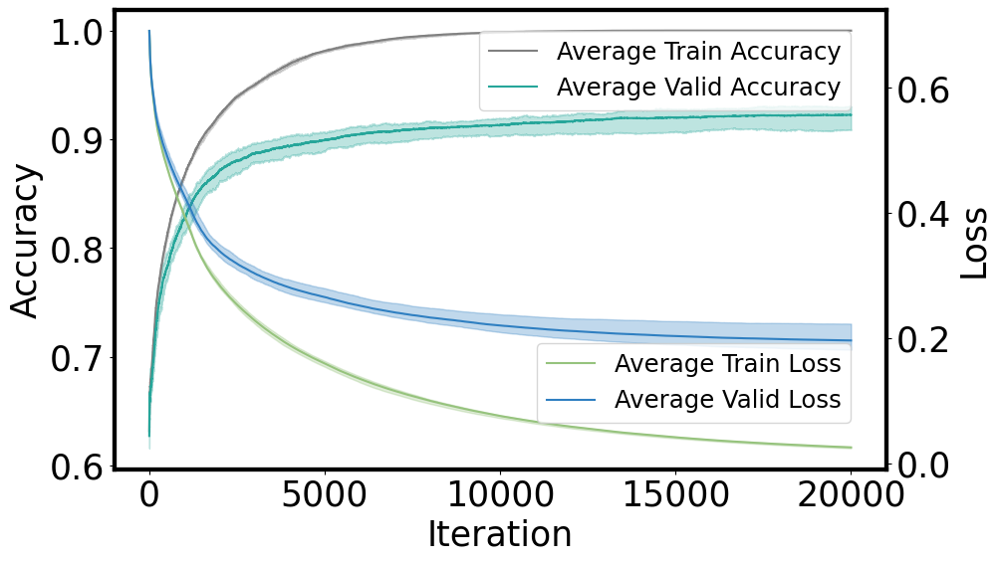

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib


# 计算平均、最大和最小LOSS值
avg_train_losses = np.mean(train_losses_by_iteration, axis=0)
avg_valid_losses = np.mean(valid_losses_by_iteration, axis=0)
max_train_losses = np.max(train_losses_by_iteration, axis=0)
min_train_losses = np.min(train_losses_by_iteration, axis=0)
max_valid_losses = np.max(valid_losses_by_iteration, axis=0)
min_valid_losses = np.min(valid_losses_by_iteration, axis=0)

# 计算平均、最大和最小准确率
avg_train_accuracy = np.mean(train_accuracy_by_iteration, axis=0)
avg_valid_accuracy = np.mean(valid_accuracy_by_iteration, axis=0)
max_train_accuracy = np.max(train_accuracy_by_iteration, axis=0)
min_train_accuracy = np.min(train_accuracy_by_iteration, axis=0)
max_valid_accuracy = np.max(valid_accuracy_by_iteration, axis=0)
min_valid_accuracy = np.min(valid_accuracy_by_iteration, axis=0)

# 设置字体和字号
# matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.size'] = 25  # 根据需要调整字号
plt.rcParams['axes.linewidth'] = 3

# 设置图片大小
plt.figure(figsize=(10, 10))  # 10宽 x 6高

fig, ax1 = plt.subplots(figsize=(10, 6))

# 绘制训练集和测试集准确率曲线，以及上下界（左轴）
ax1.plot(avg_train_accuracy, label='Average Train Accuracy', color='grey')
ax1.plot(avg_valid_accuracy, label='Average Valid Accuracy', color='#26A69A')
ax1.fill_between(np.arange(num_iterations), min_train_accuracy, max_train_accuracy, color='grey', alpha=0.3)
ax1.fill_between(np.arange(num_iterations), min_valid_accuracy, max_valid_accuracy, color='#26A69A', alpha=0.3)

ax1.set_xlabel('Iteration')
ax1.set_ylabel('Accuracy', color='black')
ax1.legend(loc='upper right', bbox_to_anchor=(0.97, 0.98), fontsize=17.5)

# 创建一个共享 x 轴的右轴用于绘制 Loss 曲线
ax2 = ax1.twinx()
ax2.plot(avg_train_losses, label='Average Train Loss', color='#96C37D')
ax2.plot(avg_valid_losses, label='Average Valid Loss', color='#2F7FC1')
ax2.fill_between(np.arange(num_iterations), min_train_losses, max_train_losses, color='#96C37D', alpha=0.3)
ax2.fill_between(np.arange(num_iterations), min_valid_losses, max_valid_losses, color='#2F7FC1', alpha=0.3)
ax2.set_ylabel('Loss', color='black')
ax2.legend(loc='upper right', bbox_to_anchor=(0.97, 0.3), fontsize=17.5)


# plt.title('Average Accuracy and Loss Curves with Min-Max Bounds', fontsize=20)
# # 在右上角添加图例，自动选择最佳位置
# ax1.legend(['Avg Train Acc', 'Avg Valid Acc', 'Avg Train Loss', 'Avg Valid Loss'], loc='best')

# # 添加网格线
# plt.grid(True)

plt.show()

# -------------------

In [170]:
# n_fold = 5
# folds = KFold(n_splits=n_fold, shuffle=True, random_state=1218)

In [179]:
# for fold_n, (train_index, valid_index) in enumerate(folds.split(train_processed)):
#     X_train, X_valid = train_processed[features].iloc[train_index], train_processed[features].iloc[valid_index]
#     y_train, y_valid = train_processed['class'].iloc[train_index], train_processed['class'].iloc[valid_index]
#     train_pool = Pool(X_train, y_train)
#     eval_pool = Pool(X_valid, y_valid)
#     model = CatBoostClassifier(iterations=20000, 
#                             #    early_stopping_rounds=200,
#                                random_seed=42,
#                             #    depth=10, 
#                                use_best_model=True,
#                                learning_rate=0.01, 
#                                devices='0',
#                                loss_function='Logloss',
#                                logging_level='Verbose')
    
#     model.fit(train_pool,
#               eval_set=eval_pool)

0:	learn: 0.6868655	test: 0.6881212	best: 0.6881212 (0)	total: 2.74ms	remaining: 54.8s
1:	learn: 0.6797496	test: 0.6810832	best: 0.6810832 (1)	total: 4.95ms	remaining: 49.5s
2:	learn: 0.6722415	test: 0.6741699	best: 0.6741699 (2)	total: 7.07ms	remaining: 47.1s
3:	learn: 0.6675790	test: 0.6700473	best: 0.6700473 (3)	total: 8.98ms	remaining: 44.9s
4:	learn: 0.6611299	test: 0.6636809	best: 0.6636809 (4)	total: 11.3ms	remaining: 45.4s
5:	learn: 0.6561362	test: 0.6589446	best: 0.6589446 (5)	total: 13.8ms	remaining: 46.1s
6:	learn: 0.6492298	test: 0.6521880	best: 0.6521880 (6)	total: 16ms	remaining: 45.8s
7:	learn: 0.6432631	test: 0.6462473	best: 0.6462473 (7)	total: 17.9ms	remaining: 44.8s
8:	learn: 0.6375754	test: 0.6409804	best: 0.6409804 (8)	total: 19.9ms	remaining: 44.2s
9:	learn: 0.6309928	test: 0.6344215	best: 0.6344215 (9)	total: 21.6ms	remaining: 43.3s
10:	learn: 0.6253099	test: 0.6290710	best: 0.6290710 (10)	total: 23.2ms	remaining: 42.2s
11:	learn: 0.6202809	test: 0.6241061	best: 

In [182]:
# with open('model/catboost_with_proc_data.pickle','wb') as f:
#     pickle.dump(model,f)

# predict

In [189]:
with open('model/catboost_with_orin_data.pickle.','rb') as f:
    model = pickle.load(f)

In [190]:
y_pred = model.predict(test[features])

In [191]:
print(metrics.accuracy_score(test["class"], y_pred))

0.9195176668536175


In [192]:
print(metrics.precision_score(test["class"], y_pred))

0.9290890269151139


In [193]:
print(metrics.recall_score(test["class"], y_pred))

0.922879177377892


# --------------------

In [194]:
# with open('model/catboost_with_proc_data.pickle.','rb') as f:
#     model = pickle.load(f)

In [195]:
# y_pred_processed = model.predict(test_processed[features])

In [196]:
# print(metrics.accuracy_score(test_processed["class"], y_pred_processed))

0.9277777777777778


In [197]:
# print(metrics.precision_score(test_processed["class"], y_pred_processed))

0.9305555555555556


In [198]:
# print(metrics.recall_score(test_processed["class"], y_pred_processed))

0.9481132075471698


# random forest

In [224]:
from sklearn.ensemble import RandomForestClassifier
# Create the model with 100 trees
rf = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt',
                               random_state=2023)
rf.fit(train[features], train["class"])

RandomForestClassifier(random_state=2023)

In [225]:
metrics.accuracy_score(rf.predict(test[features]), test["class"])

0.8143578238923164

In [226]:
metrics.precision_score(rf.predict(test[features]), test["class"])

0.8390745501285347

In [227]:
metrics.recall_score(rf.predict(test[features]), test["class"])

0.8238263503281171

# kNN

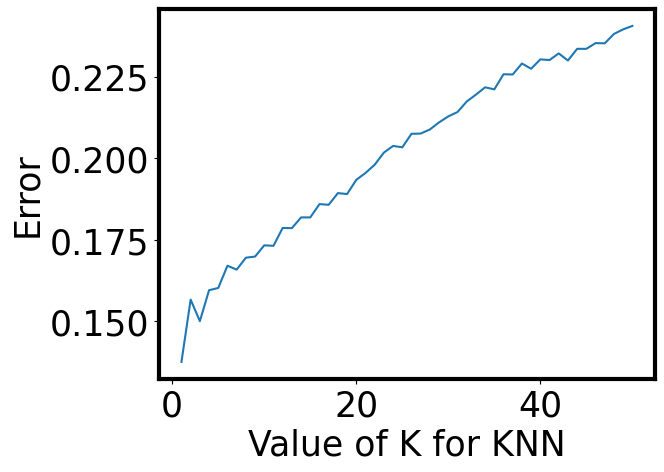

In [228]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection  import cross_val_score

#读取数据集
x = train[features]
y = train["class"]
k_range = range(1, 51)
k_error = []
#循环，取k=1到k=31，查看误差效果
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    #cv参数决定数据集划分比例，这里是按照5:1划分训练集和测试集
    scores = cross_val_score(knn, x, y, cv=6, scoring='accuracy')
    k_error.append(1 - scores.mean())

#画图，x轴为k值，y值为误差值
plt.plot(k_range, k_error)
plt.xlabel('Value of K for KNN')
plt.ylabel('Error')
plt.show()

In [235]:
# 创建k近邻实例
neigh = KNeighborsClassifier(n_neighbors=100)
# k近邻模型拟合
neigh.fit(X_train, y_train)
# k近邻模型预测
pred_knn = neigh.predict(test[features])
print(metrics.accuracy_score(pred_knn, test["class"]))

0.5280426247896803


# xgboost

In [238]:
import xgboost as xgb

model = xgb.XGBClassifier()
model.fit(train[features], train["class"])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [237]:
! pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 99.8/99.8 MB 4.2 MB/s eta 0:00:00


In [239]:
metrics.accuracy_score(model.predict(test[features]), test["class"])

0.8853056646102075

In [240]:
metrics.precision_score(model.predict(test[features]), test["class"])

0.8904884318766066

In [241]:
metrics.recall_score(model.predict(test[features]), test["class"])

0.8983402489626556

# svc

In [242]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(train[features], train["class"])

SVC()

In [243]:
metrics.accuracy_score(svc.predict(test[features]), test["class"])

0.5821648906337633

# adaboost

In [258]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

AdaBoost1 = AdaBoostClassifier(DecisionTreeClassifier(
                       max_depth=5,min_samples_split=20, #决策树最大深度为2，内部节点再划分所需最小样本数是20，叶子节点最少样本数
                       min_samples_leaf=5),algorithm="SAMME", #采用"SAMME":用对样本集分类效果作为弱学习器权重
                       n_estimators=200,learning_rate=0.8)
AdaBoost1.fit(train[features], train["class"])

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=5,
                                                    min_samples_leaf=5,
                                                    min_samples_split=20),
                   learning_rate=0.8, n_estimators=200)

In [259]:
metrics.accuracy_score(AdaBoost1.predict(test[features]), test["class"])

0.8564217610768368

In [260]:
metrics.precision_score(AdaBoost1.predict(test[features]), test["class"])

0.8704370179948586

In [261]:
metrics.recall_score(AdaBoost1.predict(test[features]), test["class"])

0.8668714797747056